# Random Forrest
First import libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore') # We can suppress the warnings
from sklearn.model_selection import train_test_split
import itertools
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree
from sklearn.metrics import classification_report, confusion_matrix
from sklearn import metrics
from sklearn.metrics import plot_roc_curve

## Bring in sample data

In [2]:
aaplTrades = pd.read_csv("new/AAPLTrades.csv")
abtTrades = pd.read_csv("new/ABTTrades.csv")
frames = [aaplTrades, abtTrades]
trades = pd.concat(frames)

## View Data and stats

In [3]:
trades.describe()

,Open,High,Low,Close,Volume,R3,R2,R1,PP,S1,...,S3,VZO,TENKAN,KIJUN,senkou_span_a,SENKOU,CHIKOU,UPPER,LOWER,StockType
count,38238.000000,38238.000000,38238.000000,38238.000000,38238.000000,38238.000000,38238.000000,38238.000000,38238.000000,38238.000000,...,38238.000000,38238.000000,38238.000000,38238.000000,38238.000000,38238.000000,38238.000000,38238.000000,38238.000000,38238.000000
mean,123.756146,123.800953,123.710767,123.755708,2345.318636,127.511750,126.240019,124.950357,123.678626,122.388964,...,119.827571,1.105856,123.756037,123.756562,123.761477,123.762156,123.750072,123.936396,123.575396,0.500000
std,5.336463,5.338025,5.334365,5.336821,3938.909621,5.543727,5.371913,5.397284,5.367938,5.527810,...,5.917003,32.761962,5.333148,5.330038,5.329908,5.325853,5.338073,5.347196,5.332685,0.500007
min,114.810000,114.880000,114.720000,114.720000,0.000000,118.278333,117.756667,117.243333,116.481667,113.890000,...,108.880000,-100.000000,114.900000,115.080000,115.110000,115.187500,114.720000,115.024479,114.539192,0.000000
25%,120.015000,120.060000,119.970000,120.015000,250.000000,123.885000,122.676667,121.126667,120.303333,119.003333,...,116.223333,-21.733334,120.032500,120.055000,120.052500,120.075000,120.010000,120.198988,119.846219,0.000000
50%,122.275000,122.320000,122.220000,122.270000,928.500000,125.901667,124.636667,123.275000,122.021667,120.611667,...,118.008333,0.378381,122.271250,122.265000,122.275000,122.262500,122.260000,122.468319,122.073778,0.500000
75%,126.198750,126.240000,126.145000,126.200000,3048.000000,130.146667,128.703333,127.581667,126.278333,124.503333,...,122.985000,24.231608,126.185000,126.190000,126.195937,126.156875,126.200000,126.408678,126.011578,1.000000
max,137.830000,137.870000,137.795000,137.820000,148148.000000,141.076667,139.233333,138.286667,136.696667,135.993333,...,135.420000,100.000000,137.762500,137.572500,137.650000,137.482500,137.820000,138.037017,137.574129,1.000000


In [4]:
trades

,Date,Symbol,Open,High,Low,Close,Volume,R3,R2,R1,...,S3,VZO,TENKAN,KIJUN,senkou_span_a,SENKOU,CHIKOU,UPPER,LOWER,StockType
0,2021-02-01 15:47:00+00:00,AAPL,133.530,133.600,133.455,133.480,3145.0,140.393333,137.886667,135.973333,...,127.133333,-9.751403,133.3850,133.1775,132.28500,132.88,133.400,134.026073,133.097919,1
1,2021-02-01 15:48:00+00:00,AAPL,133.550,133.710,133.550,133.710,710.0,140.393333,137.886667,135.973333,...,127.133333,-6.226587,133.3850,133.2275,132.37500,132.88,133.300,134.070552,133.154767,1
2,2021-02-01 15:49:00+00:00,AAPL,133.725,133.830,133.665,133.675,1806.0,140.393333,137.886667,135.973333,...,127.133333,-14.304373,133.4575,133.3050,132.37500,132.88,133.360,134.100976,133.197528,1
3,2021-02-01 15:50:00+00:00,AAPL,133.670,133.735,133.475,133.510,4211.0,140.393333,137.886667,135.973333,...,127.133333,-30.427993,133.5675,133.3050,132.44000,132.88,133.440,134.098246,133.203862,1
4,2021-02-01 15:51:00+00:00,AAPL,133.510,133.605,133.395,133.435,3613.0,140.393333,137.886667,135.973333,...,127.133333,-41.352122,133.6125,133.3050,132.44000,132.88,133.420,134.081576,133.195133,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19114,2021-04-09 15:45:00+00:00,ABT,119.840,119.870,119.840,119.870,200.0,123.013333,122.276667,121.008333,...,116.998333,26.565421,119.7375,119.6250,119.48125,119.52,119.650,119.948445,119.756591,0
19115,2021-04-09 15:46:00+00:00,ABT,119.885,119.885,119.845,119.860,300.0,123.013333,122.276667,121.008333,...,116.998333,8.028032,119.7825,119.6275,119.48125,119.52,119.670,119.957476,119.769421,0
19116,2021-04-09 15:47:00+00:00,ABT,119.855,119.870,119.840,119.850,110.0,123.013333,122.276667,121.008333,...,116.998333,1.724576,119.8425,119.6275,119.49125,119.52,119.660,119.962895,119.778542,0
19117,2021-04-09 15:48:00+00:00,ABT,119.850,119.870,119.850,119.870,101.0,123.013333,122.276667,121.008333,...,116.998333,7.446123,119.8575,119.6275,119.49125,119.52,119.710,119.970242,119.789812,0


In [5]:
print(trades.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38238 entries, 0 to 19118
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           38238 non-null  object 
 1   Symbol         38238 non-null  object 
 2   Open           38238 non-null  float64
 3   High           38238 non-null  float64
 4   Low            38238 non-null  float64
 5   Close          38238 non-null  float64
 6   Volume         38238 non-null  float64
 7   R3             38238 non-null  float64
 8   R2             38238 non-null  float64
 9   R1             38238 non-null  float64
 10  PP             38238 non-null  float64
 11  S1             38238 non-null  float64
 12  S2             38238 non-null  float64
 13  S3             38238 non-null  float64
 14  VZO            38238 non-null  float64
 15  TENKAN         38238 non-null  float64
 16  KIJUN          38238 non-null  float64
 17  senkou_span_a  38238 non-null  float64
 18  SENKOU

## Scatter Plot to see any possible correlations in data

<Figure size 1440x720 with 0 Axes>

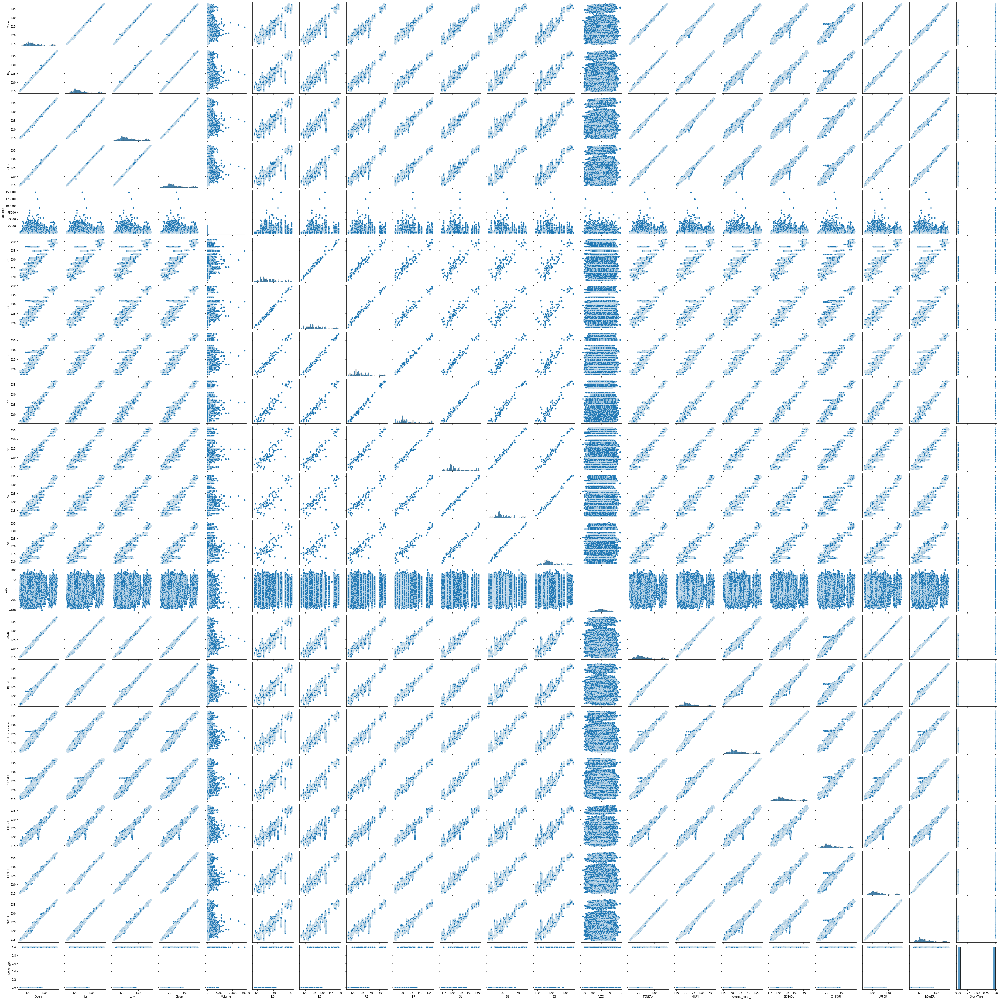

In [6]:
# paiwise scatter plot
plt.figure(figsize=(20, 10))
sns.pairplot(trades)
plt.show()

## Make correlation Matrix to prepare data for heatmap

In [7]:
# correlation matrix
cor = trades.corr()
cor

,Open,High,Low,Close,Volume,R3,R2,R1,PP,S1,...,S3,VZO,TENKAN,KIJUN,senkou_span_a,SENKOU,CHIKOU,UPPER,LOWER,StockType
Open,1.000000,0.999932,0.999929,0.999880,0.089494,0.928341,0.960633,0.977970,0.985919,0.978741,...,0.936658,0.054315,0.999660,0.998866,0.995143,0.993442,0.995627,0.999484,0.999433,0.499147
High,0.999932,1.000000,0.999877,0.999932,0.093342,0.929425,0.961385,0.978348,0.985932,0.978392,...,0.935661,0.055533,0.999629,0.998854,0.995183,0.993510,0.995656,0.999560,0.999276,0.501569
Low,0.999929,0.999877,1.000000,0.999935,0.085161,0.927262,0.959866,0.977594,0.985887,0.979089,...,0.937651,0.057067,0.999602,0.998778,0.994980,0.993257,0.995691,0.999317,0.999502,0.496750
Close,0.999880,0.999932,0.999935,1.000000,0.088974,0.928337,0.960610,0.977973,0.985903,0.978752,...,0.936675,0.058252,0.999578,0.998774,0.995038,0.993341,0.995726,0.999405,0.999359,0.499105
Volume,0.089494,0.093342,0.085161,0.088974,1.000000,0.183621,0.153916,0.122792,0.087860,0.055636,...,-0.008053,-0.065921,0.090419,0.091674,0.096144,0.097335,0.089646,0.100240,0.078803,0.472991
R3,0.928341,0.929425,0.927262,0.928337,0.183621,1.000000,0.991799,0.975057,0.940172,0.901186,...,0.794409,0.014420,0.928602,0.929100,0.929806,0.930327,0.926705,0.932159,0.923443,0.560938
R2,0.960633,0.961385,0.959866,0.960610,0.153916,0.991799,1.000000,0.991861,0.973746,0.942228,...,0.855763,0.018236,0.960988,0.961707,0.962646,0.963705,0.958345,0.963128,0.956986,0.547107
R1,0.977970,0.978348,0.977594,0.977973,0.122792,0.975057,0.991861,1.000000,0.991075,0.974911,...,0.909406,0.033463,0.978198,0.978646,0.978611,0.979102,0.976684,0.978971,0.975836,0.521552
PP,0.985919,0.985932,0.985887,0.985903,0.087860,0.940172,0.973746,0.991075,1.000000,0.992468,...,0.950351,0.037003,0.986233,0.986888,0.987065,0.988080,0.984025,0.985480,0.985182,0.492608
S1,0.978741,0.978392,0.979089,0.978752,0.055636,0.901186,0.942228,0.974911,0.992468,1.000000,...,0.979170,0.050883,0.978925,0.979299,0.978524,0.978960,0.977869,0.976867,0.979487,0.455920


## Plot heatmap
The data as you can see is pretty uniform we will need to remove some features

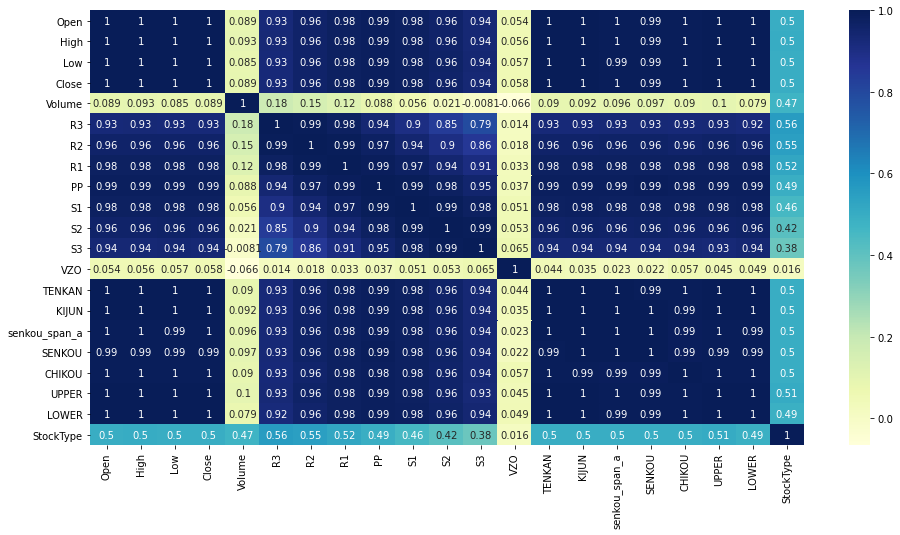

In [8]:
# plotting correlations on a heatmap

# figure size
plt.figure(figsize=(16,8))

# heatmap
sns.heatmap(cor, cmap="YlGnBu", annot=True)
plt.show()

In [9]:
# Do not need this after all will use random state in random forest
#trades = shuffle(trades)

## Split Features and target colomn for prediction

In [10]:
X = trades.iloc[:,2:21].values
y = trades.iloc[:,22].values

## Split the data for random Forrest
Play with the test size to see different accuracies

In [11]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.90)

## Build the model using Random Forrest Classifier
you can change any of the numbers in green to see the different results but so far the numbers below are the best without overfitting.  I messed with  them a good bit. 

In [12]:
clf = RandomForestClassifier(n_estimators=100,min_samples_split=10,min_samples_leaf=2, 
                               max_features = 'sqrt',max_depth = 10, random_state = 1, bootstrap = True)
clf.fit(X_train,y_train)

y_pred = clf.predict(X_test)

## Model Accuracy
This is quite high and a bit suspicoius but would like to see the results on all our data.

In [13]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.988435275315996


## Plot feature importance
This we can see what the feature imporcances are in the prediction.  I did not not think volume was as important but it is along with pivot points.  We need 12 features and I would prefer to replace CHIKOU with Low.  Not very clear on graph below but was very clear in spyder.

No handles with labels found to put in legend.


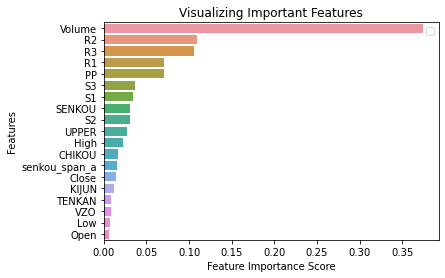

In [14]:
# Get feature names and imporance levels
feature_imp = pd.Series(clf.feature_importances_,index=trades.iloc[:, 2:21].columns).sort_values(ascending=False)
# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.legend()
plt.show();

## Get some stats on our prediction
Again prediction is quite high.

In [15]:
# print(confusion_matrix(y_test,y_pred)) Removed this as I will plot it furter down.
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99     17256
           1       0.99      0.99      0.99     17159

    accuracy                           0.99     34415
   macro avg       0.99      0.99      0.99     34415
weighted avg       0.99      0.99      0.99     34415



## Now to plot Confusion Matrix

In [16]:
matrix = [y_test, y_pred]
confusionMatrix = pd.DataFrame(y_test, y_pred);

In [17]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Oranges):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    Source: http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    # Plot the confusion matrix
    plt.figure(figsize = (10, 10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, size = 24)
    plt.colorbar(aspect=4)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45, size = 14)
    plt.yticks(tick_marks, classes, size = 14)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    
    # Labeling the plot
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), fontsize = 20,
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
        
    plt.grid(None)
    plt.tight_layout()
    plt.ylabel('True label', size = 18)
    plt.xlabel('Predicted label', size = 18)



Confusion matrix, without normalization
[[17047   209]
 [  189 16970]]


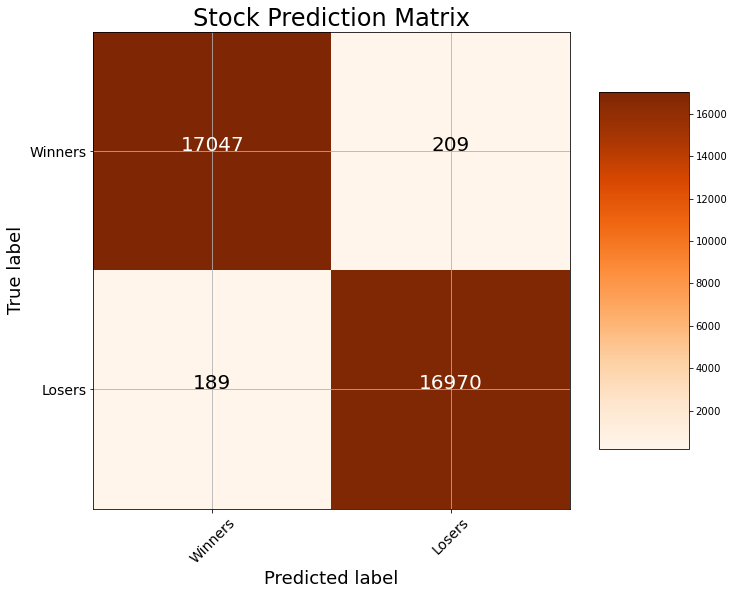

In [18]:
# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
plot_confusion_matrix(cm, classes = ['Winners', 'Losers'],
                      title = 'Stock Prediction Matrix')

plt.savefig('cm.png')

## Plot the tree
See below plotted tree... not sure if we want this as it is very hard to read but we could use the gini stats in our report.

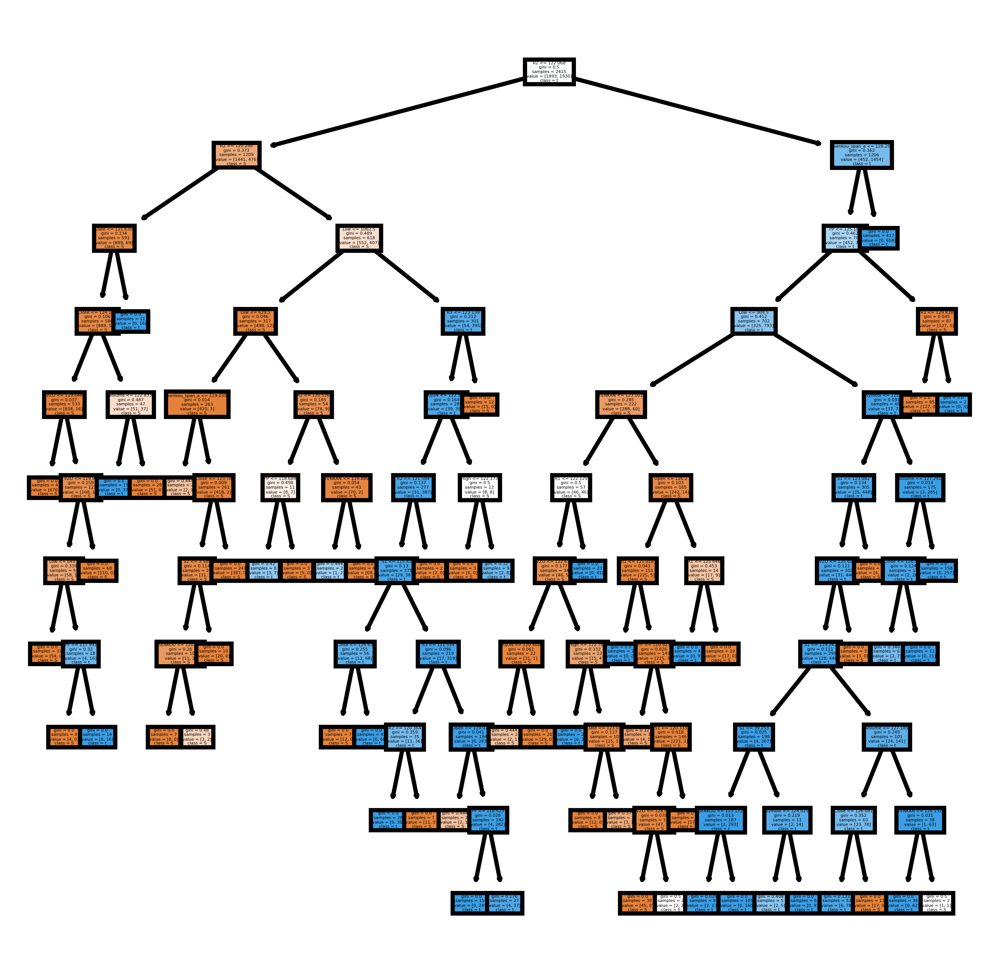

In [19]:
fn=trades.columns
cn='StockType'
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=800)
tree.plot_tree(clf.estimators_[0],
               feature_names = fn, 
               class_names=cn,
               filled = True);
fig.savefig('rf_individualtree.png')

## More stats on the Random Forrest
This shows the nodes and maximum depth which is mostly at 10 as set above.

In [20]:
n_nodes = []
max_depths = []

for ind_tree in clf.estimators_:
    n_nodes.append(ind_tree.tree_.node_count)
    max_depths.append(ind_tree.tree_.max_depth)
    print(f'Average number of nodes {int(np.mean(n_nodes))}')
    print(f'Average maximum depth {int(np.mean(max_depths))}')

Average number of nodes 113
Average maximum depth 10
Average number of nodes 112
Average maximum depth 10
Average number of nodes 105
Average maximum depth 10
Average number of nodes 108
Average maximum depth 10
Average number of nodes 108
Average maximum depth 10
Average number of nodes 106
Average maximum depth 10
Average number of nodes 107
Average maximum depth 10
Average number of nodes 109
Average maximum depth 10
Average number of nodes 104
Average maximum depth 10
Average number of nodes 106
Average maximum depth 10
Average number of nodes 104
Average maximum depth 10
Average number of nodes 100
Average maximum depth 10
Average number of nodes 99
Average maximum depth 10
Average number of nodes 100
Average maximum depth 10
Average number of nodes 100
Average maximum depth 10
Average number of nodes 99
Average maximum depth 10
Average number of nodes 98
Average maximum depth 10
Average number of nodes 96
Average maximum depth 10
Average number of nodes 96
Average maximum depth 1

## Show ROC Curve on false positve and true positive
not much difference here

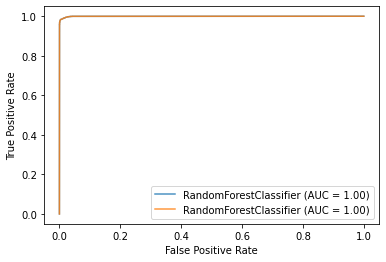

In [21]:
ax = plt.gca()
clf_disp = plot_roc_curve(clf, X_test, y_test, ax=ax, alpha=0.8)
clf_disp.plot(ax=ax, alpha=0.8)
plt.show()

## Lets implement the changes

In [22]:
trades.columns

Index(['Date', 'Symbol', 'Open', 'High', 'Low', 'Close', 'Volume', 'R3', 'R2',
       'R1', 'PP', 'S1', 'S2', 'S3', 'VZO', 'TENKAN', 'KIJUN', 'senkou_span_a',
       'SENKOU', 'CHIKOU', 'UPPER', 'LOWER', 'StockType'],
      dtype='object')

Remove unneccesary columns 

In [23]:
trades = trades.drop(columns=['Open','KIJUN','TENKAN','senkou_span_a','VZO','CHIKOU'])

In [24]:
trades

,Date,Symbol,High,Low,Close,Volume,R3,R2,R1,PP,S1,S2,S3,SENKOU,UPPER,LOWER,StockType
0,2021-02-01 15:47:00+00:00,AAPL,133.600,133.455,133.480,3145.0,140.393333,137.886667,135.973333,133.466667,131.553333,129.046667,127.133333,132.88,134.026073,133.097919,1
1,2021-02-01 15:48:00+00:00,AAPL,133.710,133.550,133.710,710.0,140.393333,137.886667,135.973333,133.466667,131.553333,129.046667,127.133333,132.88,134.070552,133.154767,1
2,2021-02-01 15:49:00+00:00,AAPL,133.830,133.665,133.675,1806.0,140.393333,137.886667,135.973333,133.466667,131.553333,129.046667,127.133333,132.88,134.100976,133.197528,1
3,2021-02-01 15:50:00+00:00,AAPL,133.735,133.475,133.510,4211.0,140.393333,137.886667,135.973333,133.466667,131.553333,129.046667,127.133333,132.88,134.098246,133.203862,1
4,2021-02-01 15:51:00+00:00,AAPL,133.605,133.395,133.435,3613.0,140.393333,137.886667,135.973333,133.466667,131.553333,129.046667,127.133333,132.88,134.081576,133.195133,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19114,2021-04-09 15:45:00+00:00,ABT,119.870,119.840,119.870,200.0,123.013333,122.276667,121.008333,120.271667,119.003333,118.266667,116.998333,119.52,119.948445,119.756591,0
19115,2021-04-09 15:46:00+00:00,ABT,119.885,119.845,119.860,300.0,123.013333,122.276667,121.008333,120.271667,119.003333,118.266667,116.998333,119.52,119.957476,119.769421,0
19116,2021-04-09 15:47:00+00:00,ABT,119.870,119.840,119.850,110.0,123.013333,122.276667,121.008333,120.271667,119.003333,118.266667,116.998333,119.52,119.962895,119.778542,0
19117,2021-04-09 15:48:00+00:00,ABT,119.870,119.850,119.870,101.0,123.013333,122.276667,121.008333,120.271667,119.003333,118.266667,116.998333,119.52,119.970242,119.789812,0


Split the features and target

In [25]:
X = trades.iloc[:,2:15].values
y = trades.iloc[:,16].values

Split the data into test and train.

In [26]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.90)

Re run the random forest with the same settings.  Feel free to mess with them.

In [27]:
clf = RandomForestClassifier(n_estimators=100,min_samples_split=10,min_samples_leaf=2, 
                               max_features = 'sqrt',max_depth = 10, random_state = 1)#bootstrap = True)
clf.fit(X_train,y_train)

y_pred = clf.predict(X_test)

Accuracy did improve by a bit.

In [28]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.9890164172599157


The features seem easier to see and verify the previous assertation.

No handles with labels found to put in legend.


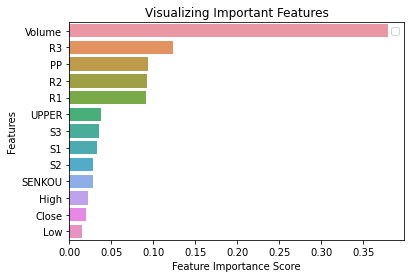

In [29]:
# Get feature names and imporance levels
feature_imp = pd.Series(clf.feature_importances_,index=trades.iloc[:, 2:15].columns).sort_values(ascending=False)
# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.legend()
plt.show();

See the stats on the model

In [30]:
#print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99     17196
           1       0.99      0.99      0.99     17219

    accuracy                           0.99     34415
   macro avg       0.99      0.99      0.99     34415
weighted avg       0.99      0.99      0.99     34415



Prepare the confusion Matrix.

In [31]:
matrix = [y_test, y_pred]
confusionMatrix = pd.DataFrame(y_test, y_pred);

Confusion matrix, without normalization
[[16954   242]
 [  136 17083]]


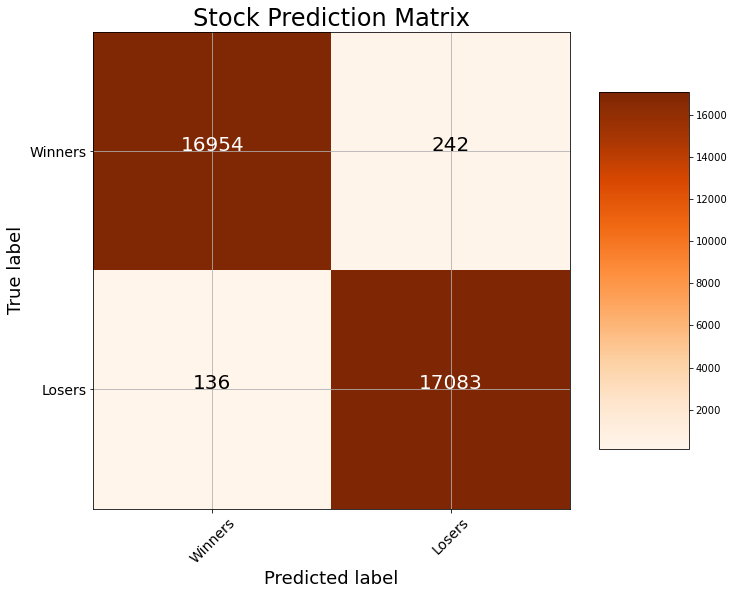

In [32]:
# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
plot_confusion_matrix(cm, classes = ['Winners', 'Losers'],
                      title = 'Stock Prediction Matrix')

plt.savefig('cm.png')

The new tree looks much cleaner... maybe we could do better.

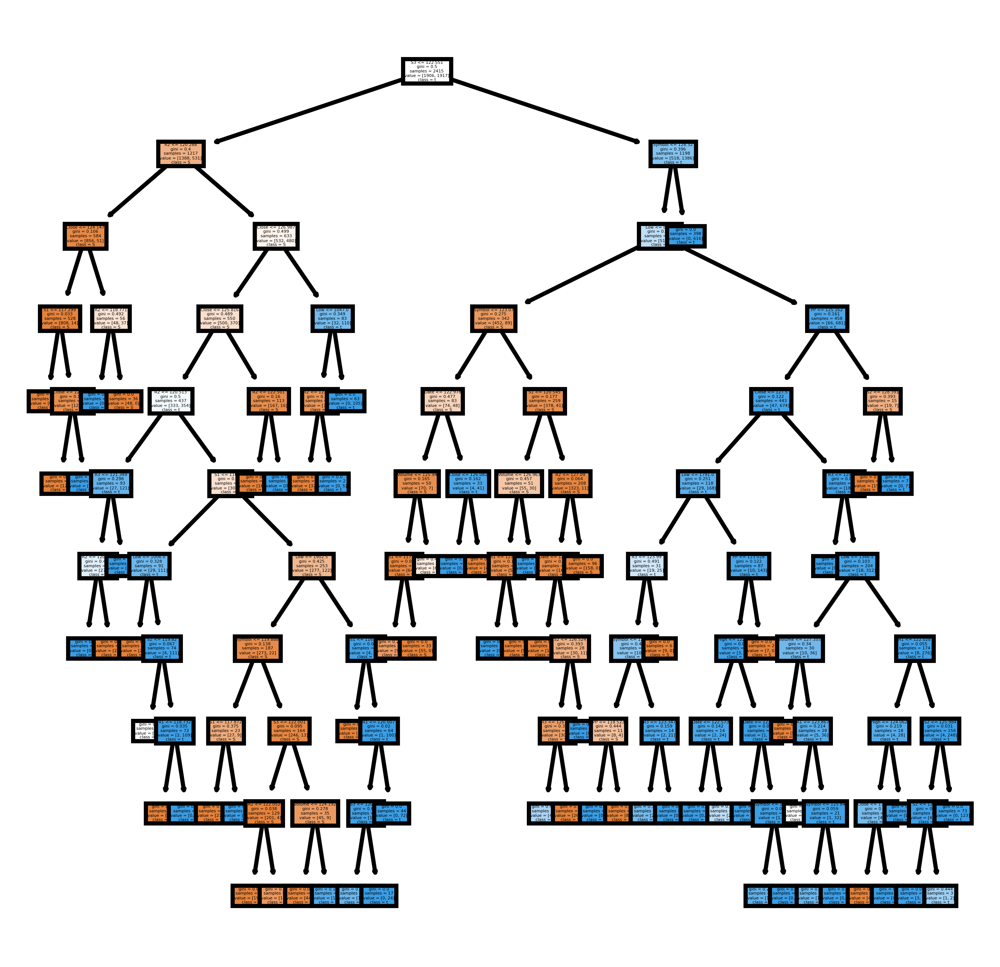

In [33]:
fn=trades.columns
cn='StockType'
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=800)
tree.plot_tree(clf.estimators_[0],
               feature_names = fn, 
               class_names=cn,
               filled = True);
fig.savefig('rf_individualtree.png')

More stats on random forest

In [34]:
n_nodes = []
max_depths = []

for ind_tree in clf.estimators_:
    n_nodes.append(ind_tree.tree_.node_count)
    max_depths.append(ind_tree.tree_.max_depth)
    print(f'Average number of nodes {int(np.mean(n_nodes))}')
    print(f'Average maximum depth {int(np.mean(max_depths))}')

Average number of nodes 129
Average maximum depth 10
Average number of nodes 109
Average maximum depth 10
Average number of nodes 119
Average maximum depth 10
Average number of nodes 111
Average maximum depth 10
Average number of nodes 112
Average maximum depth 10
Average number of nodes 111
Average maximum depth 10
Average number of nodes 109
Average maximum depth 10
Average number of nodes 109
Average maximum depth 10
Average number of nodes 106
Average maximum depth 10
Average number of nodes 103
Average maximum depth 10
Average number of nodes 105
Average maximum depth 10
Average number of nodes 105
Average maximum depth 10
Average number of nodes 105
Average maximum depth 10
Average number of nodes 106
Average maximum depth 10
Average number of nodes 104
Average maximum depth 10
Average number of nodes 102
Average maximum depth 10
Average number of nodes 101
Average maximum depth 10
Average number of nodes 102
Average maximum depth 10
Average number of nodes 104
Average maximum de

ROC looks the same.

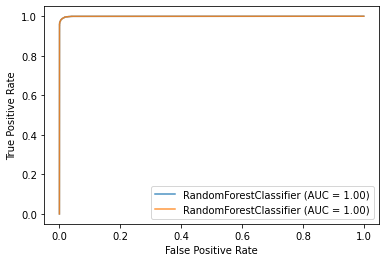

In [35]:
ax = plt.gca()
clf_disp = plot_roc_curve(clf, X_test, y_test, ax=ax, alpha=0.8)
clf_disp.plot(ax=ax, alpha=0.8)
plt.show()

see if correlation plots look any different

<Figure size 1440x720 with 0 Axes>

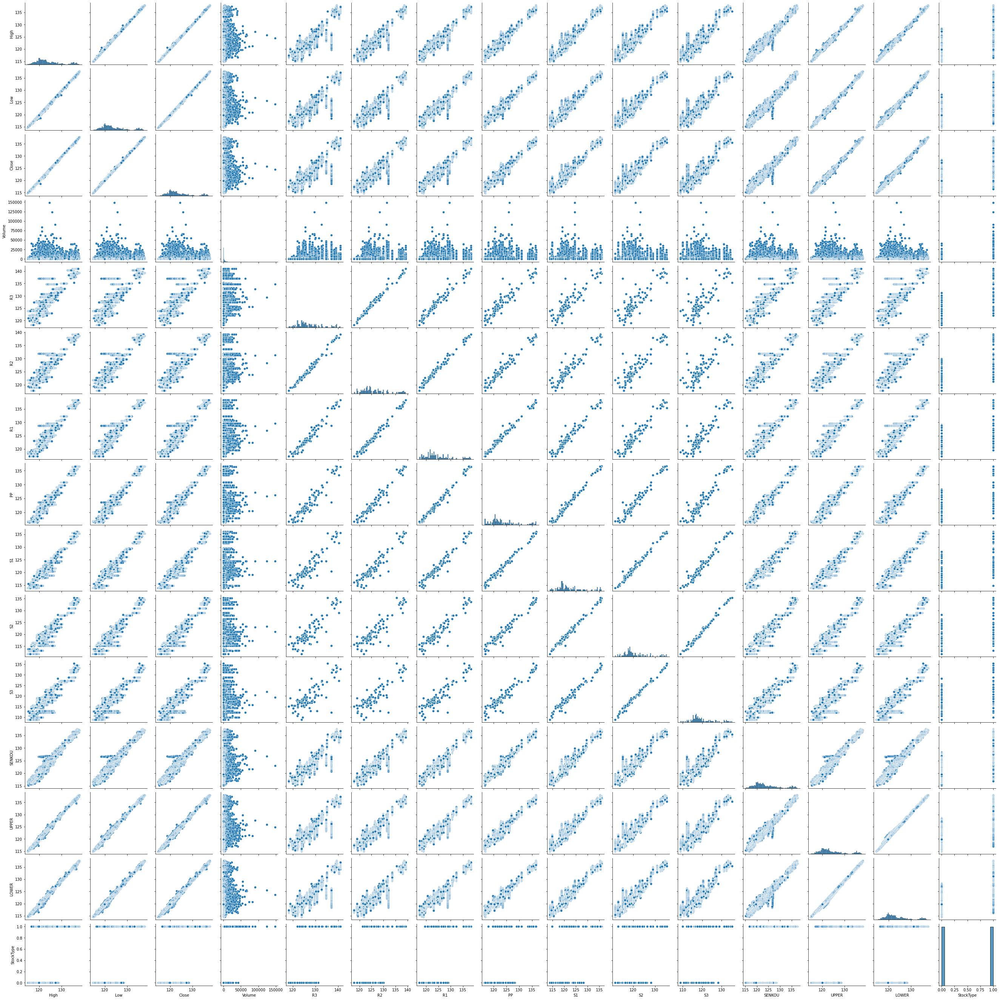

In [36]:
# paiwise scatter plot
plt.figure(figsize=(20, 10))
sns.pairplot(trades)
plt.show()

In [37]:
# correlation matrix
cor = trades.corr()
cor

,High,Low,Close,Volume,R3,R2,R1,PP,S1,S2,S3,SENKOU,UPPER,LOWER,StockType
High,1.000000,0.999877,0.999932,0.093342,0.929425,0.961385,0.978348,0.985932,0.978392,0.961198,0.935661,0.993510,0.999560,0.999276,0.501569
Low,0.999877,1.000000,0.999935,0.085161,0.927262,0.959866,0.977594,0.985887,0.979089,0.962561,0.937651,0.993257,0.999317,0.999502,0.496750
Close,0.999932,0.999935,1.000000,0.088974,0.928337,0.960610,0.977973,0.985903,0.978752,0.961882,0.936675,0.993341,0.999405,0.999359,0.499105
Volume,0.093342,0.085161,0.088974,1.000000,0.183621,0.153916,0.122792,0.087860,0.055636,0.020646,-0.008053,0.097335,0.100240,0.078803,0.472991
R3,0.929425,0.927262,0.928337,0.183621,1.000000,0.991799,0.975057,0.940172,0.901186,0.845109,0.794409,0.930327,0.932159,0.923443,0.560938
R2,0.961385,0.959866,0.960610,0.153916,0.991799,1.000000,0.991861,0.973746,0.942228,0.901215,0.855763,0.963705,0.963128,0.956986,0.547107
R1,0.978348,0.977594,0.977973,0.122792,0.975057,0.991861,1.000000,0.991075,0.974911,0.941958,0.909406,0.979102,0.978971,0.975836,0.521552
PP,0.985932,0.985887,0.985903,0.087860,0.940172,0.973746,0.991075,1.000000,0.992468,0.976206,0.950351,0.988080,0.985480,0.985182,0.492608
S1,0.978392,0.979089,0.978752,0.055636,0.901186,0.942228,0.974911,0.992468,1.000000,0.991890,0.979170,0.978960,0.976867,0.979487,0.455920
S2,0.961198,0.962561,0.961882,0.020646,0.845109,0.901215,0.941958,0.976206,0.991890,1.000000,0.994075,0.963078,0.958676,0.963961,0.416651


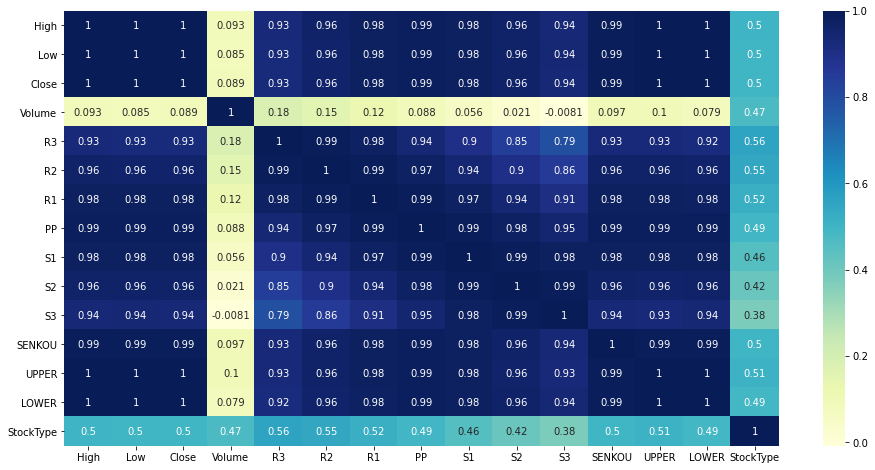

In [38]:
# plotting correlations on a heatmap

# figure size
plt.figure(figsize=(16,8))

# heatmap
sns.heatmap(cor, cmap="YlGnBu", annot=True)
plt.show()

heatmap data still looks pretty uniform.